In [1]:
import pandas as pd
import scanpy as sc 
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import rcParams
import os,re


In [2]:
os.chdir("/home/maolp/data5/Gaofeng_All_matrix/Allcount/")

In [3]:
os.getcwd()

'/data5/maolp/Gaofeng_All_matrix/Allcount'

In [4]:


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore', 'No data for colormapping provided via', UserWarning)


In [5]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [3, 3]
plt.rcParams['figure.dpi'] = 300

In [6]:
adata1=sc.read_h5ad('./All_scanpyData/Data/Scanpy_merge_rmdoubulet_UMAP_label_lastCell.h5ad')

In [7]:
adata1

AnnData object with n_obs × n_vars = 245834 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

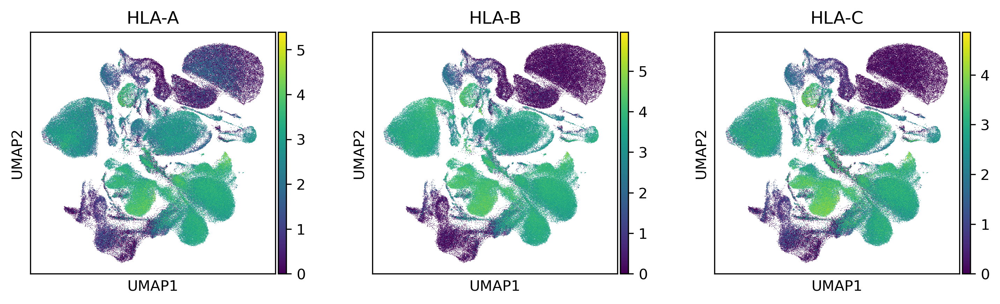

In [8]:
sc.pl.umap(adata1,color=["HLA-A","HLA-B","HLA-C"])

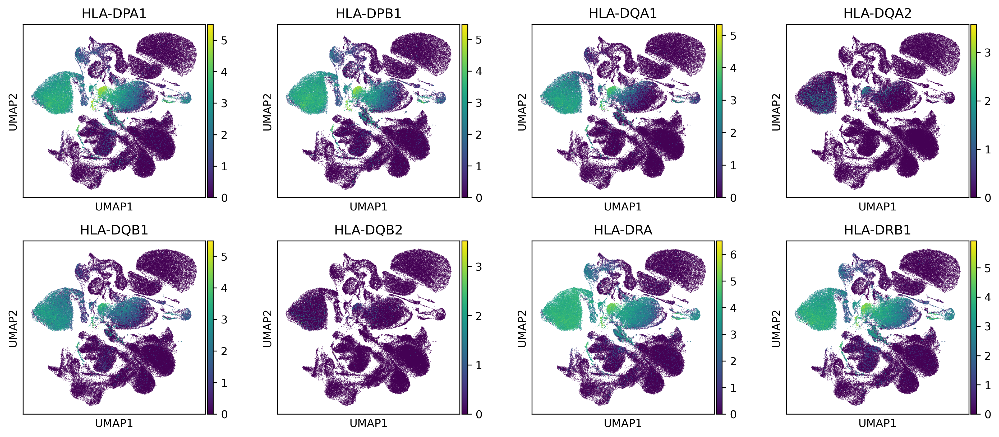

In [9]:
sc.pl.umap(adata1,color=["HLA-DPA1", "HLA-DPB1", "HLA-DQA1", "HLA-DQA2", "HLA-DQB1", "HLA-DQB2", "HLA-DRA", "HLA-DRB1"])

In [10]:
adata1

AnnData object with n_obs × n_vars = 245834 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [11]:
adata1.uns['log1p']["base"] = None

In [12]:
cols01 = ["#f49128", "#194a55", "#187c65", "#f26115", "#c29f62", "#83ba9e"]
cols02 = ["#c62d17", "#023f75", "#ea894e", "#266b69", "#eb4601", "#f6c619"]
cols03 = ["#fa6e01", "#2f2f2f", "#972b1d", "#e6a84b", "#4c211b", "#ff717f"]
cols04 = ["#223e9c", "#b12b23", "#aebea6", "#edae11", "#0f6657", "#c74732"]
cols05 = ["#6a73cf", "#edd064", "#0eb0c8", "#f2ccac", "#a1d5b9", "#e1abbc"]

all_colors = cols01 + cols02 + cols03 + cols04 + cols05

colorname2 = [
    "#46A040", "#00AF99", "#FFC179", "#98D9E9", "#F6313E", "#FFA300", "#333366",
    "#FF5A00", "#663366", "#FF6666", "#8F1336", "#0081C9", "#001588", "#CC0033",
    "#CC9966", "#CC0033", "#999933", "#009966", "#CCCC33", "#CCFF99", "#333399",
    "#993333", "#490C65", "#BA7FD0", "#A6CEE3", "#1F78B4", "#DE77AE", "#B2DF8A",
    "#006D2C", "#868686", "#B5AD64", "#9DA8E2", "#91C392", "#FF9900", "#339966"
] + all_colors

colorname3 = colorname2[:]

print(colorname3)
print(len(colorname3))


['#46A040', '#00AF99', '#FFC179', '#98D9E9', '#F6313E', '#FFA300', '#333366', '#FF5A00', '#663366', '#FF6666', '#8F1336', '#0081C9', '#001588', '#CC0033', '#CC9966', '#CC0033', '#999933', '#009966', '#CCCC33', '#CCFF99', '#333399', '#993333', '#490C65', '#BA7FD0', '#A6CEE3', '#1F78B4', '#DE77AE', '#B2DF8A', '#006D2C', '#868686', '#B5AD64', '#9DA8E2', '#91C392', '#FF9900', '#339966', '#f49128', '#194a55', '#187c65', '#f26115', '#c29f62', '#83ba9e', '#c62d17', '#023f75', '#ea894e', '#266b69', '#eb4601', '#f6c619', '#fa6e01', '#2f2f2f', '#972b1d', '#e6a84b', '#4c211b', '#ff717f', '#223e9c', '#b12b23', '#aebea6', '#edae11', '#0f6657', '#c74732', '#6a73cf', '#edd064', '#0eb0c8', '#f2ccac', '#a1d5b9', '#e1abbc']
65


In [13]:
adata1.obs["Cell_lineage"]=adata1.obs["Cell_lineage"].astype('str')

In [14]:
adata1.obs["Cell_lineage"].unique()

array(['B_CELL', 'MK/ERY', 'T/ILC', 'PRECURSOR', 'NK', 'DC', 'MYELOID',
       'OTHERS'], dtype=object)

In [15]:
adata1

AnnData object with n_obs × n_vars = 245834 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [16]:
def create_palette(cell_types, colors):
    cell_type_colors = {}
    for i, cell_type in enumerate(cell_types):
        color = colors[i % len(colors)]
        cell_type_colors[cell_type] = color
    return cell_type_colors

In [17]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

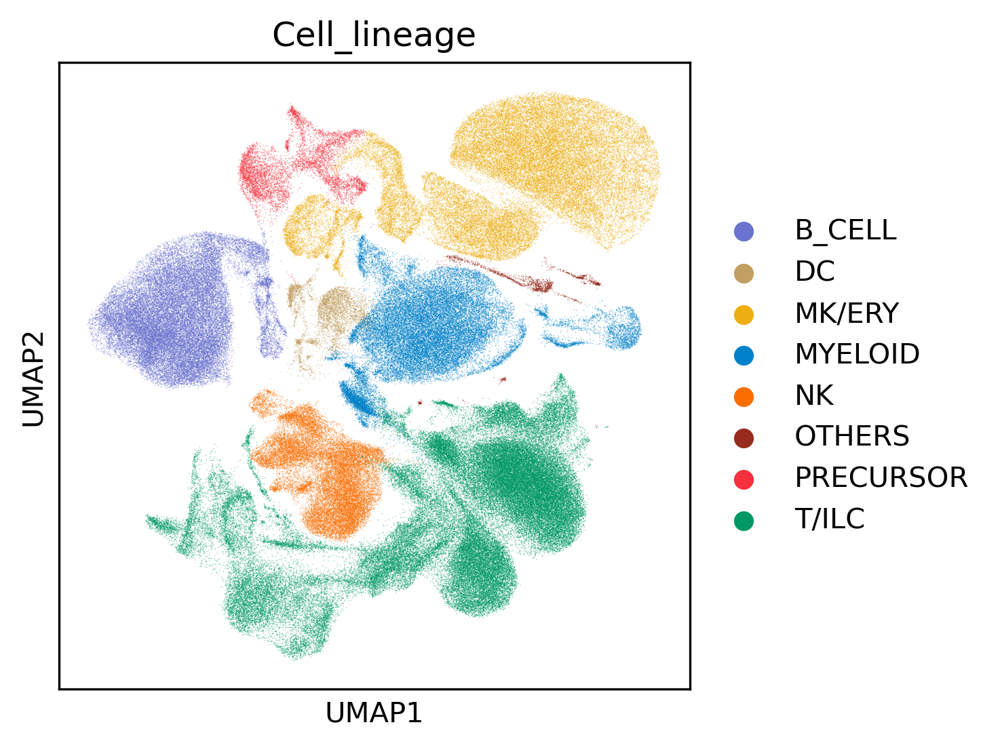

In [18]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata1, color = [ "Cell_lineage"],palette=create_palette(adata1.obs["Cell_lineage"].unique(),["#6a73cf","#edae11","#009966","#F6313E", "#fa6e01", "#c29f62","#0081C9","#972b1d"]), alpha=0.5,legend_fontweight="normal")


In [19]:
# adata1.obs['Last_cellm']=adata1.obs['Last_cell_type']

In [20]:
# adata1.obs['Last_cellm']
adata1.obs['Last_cellm']=adata1.obs['Last_cell_type']

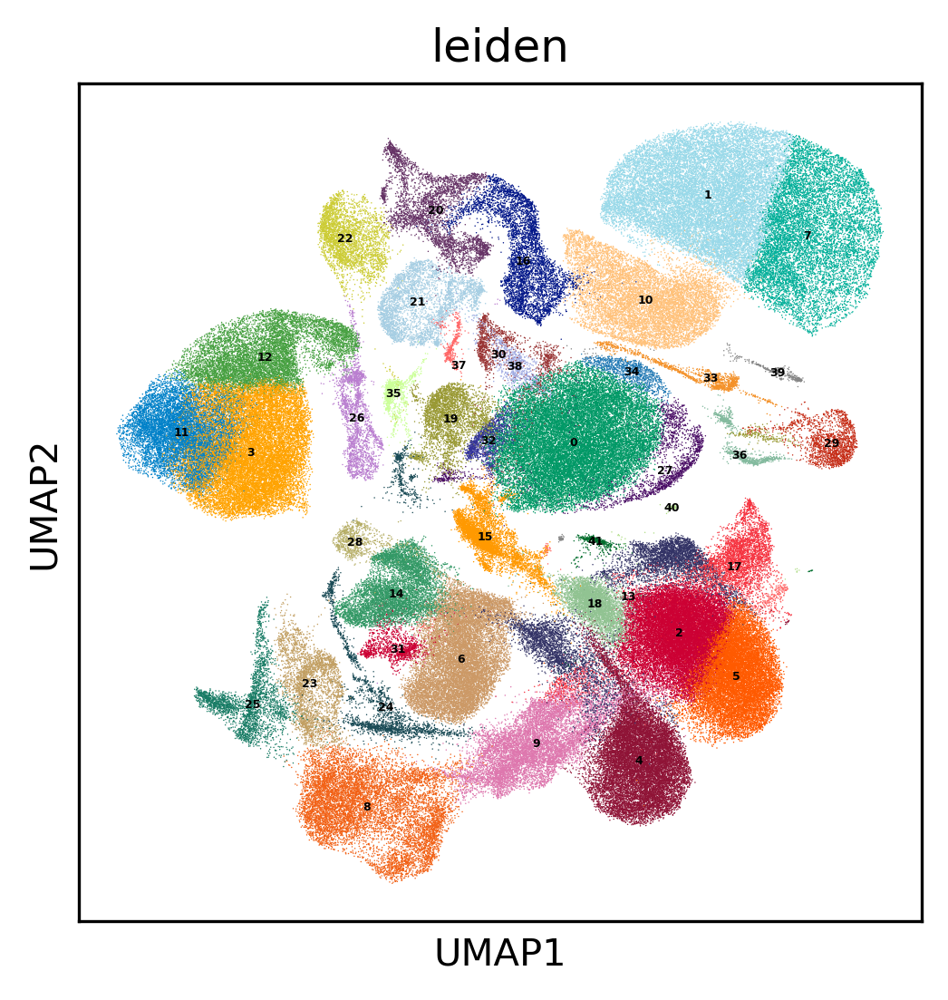

In [21]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata1, color = [ "leiden"],legend_loc='on data',legend_fontsize=3)


In [22]:
# sub23.obs['Last_cell_type'].value_counts()

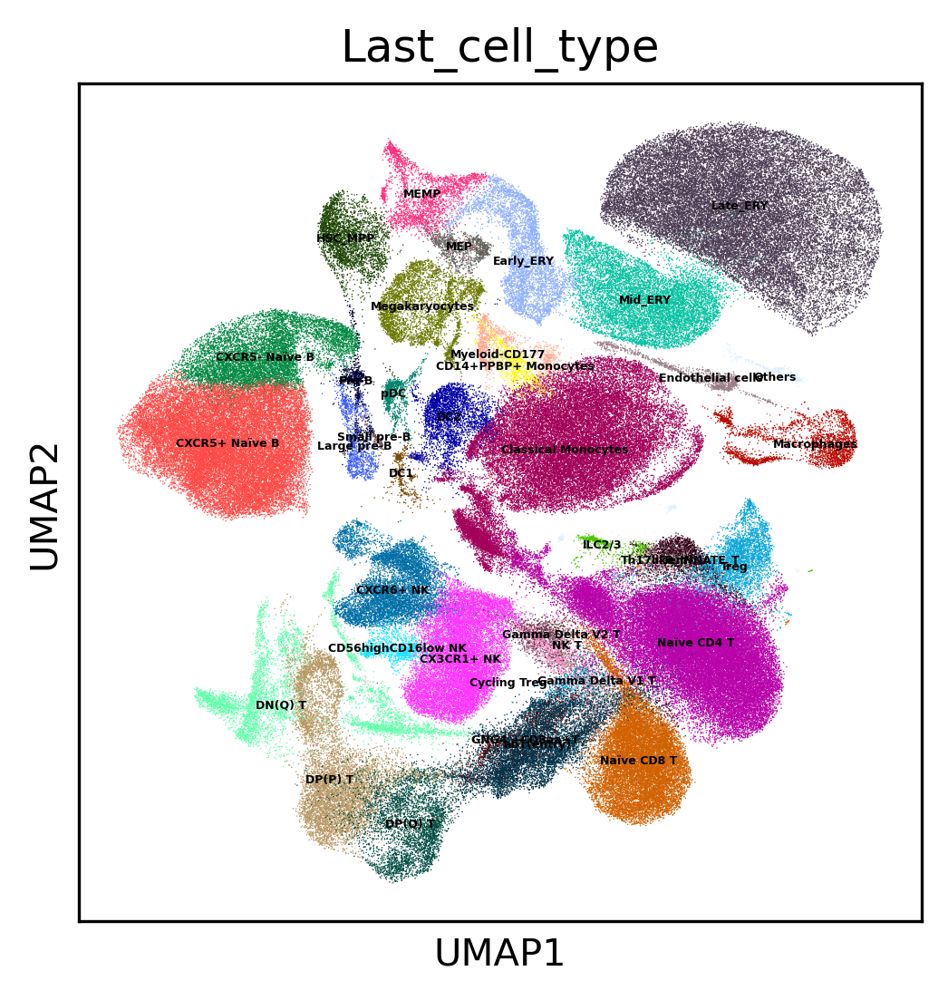

In [23]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata1, color = [ "Last_cell_type"],legend_loc='on data',legend_fontsize=3)


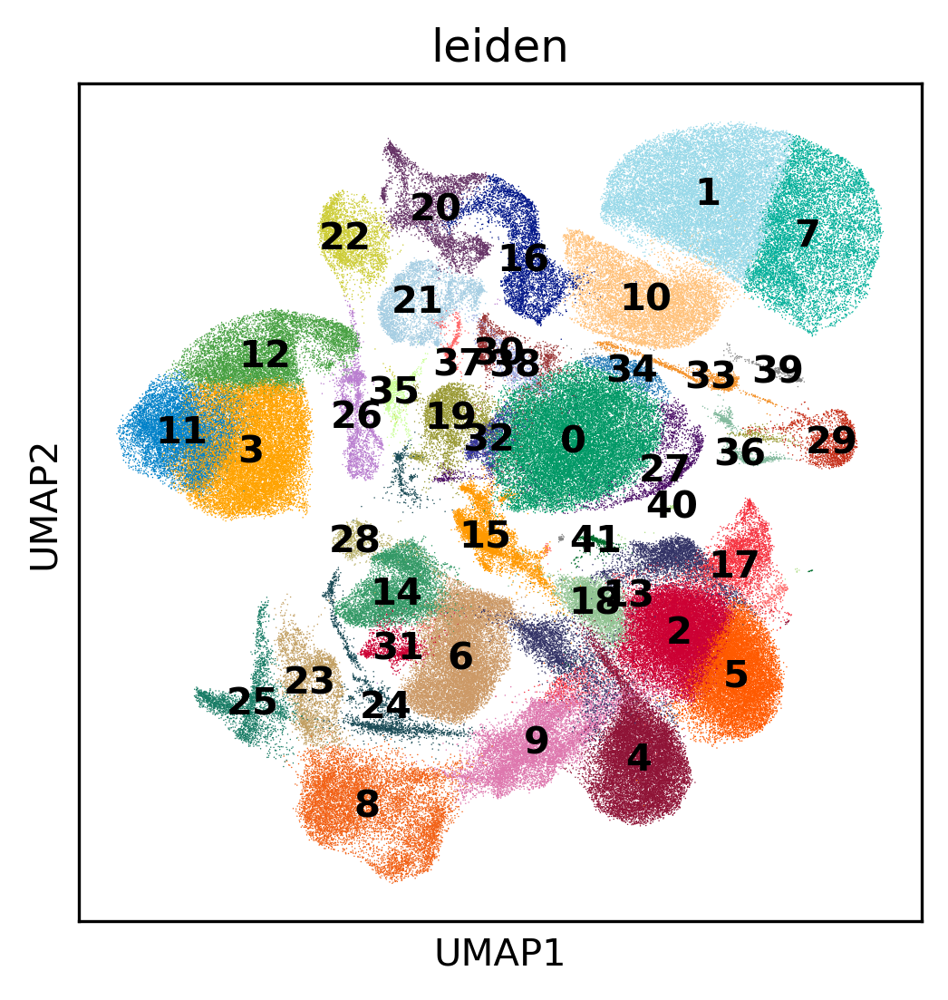

In [24]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata1, color = [ "leiden"],legend_loc='on data')


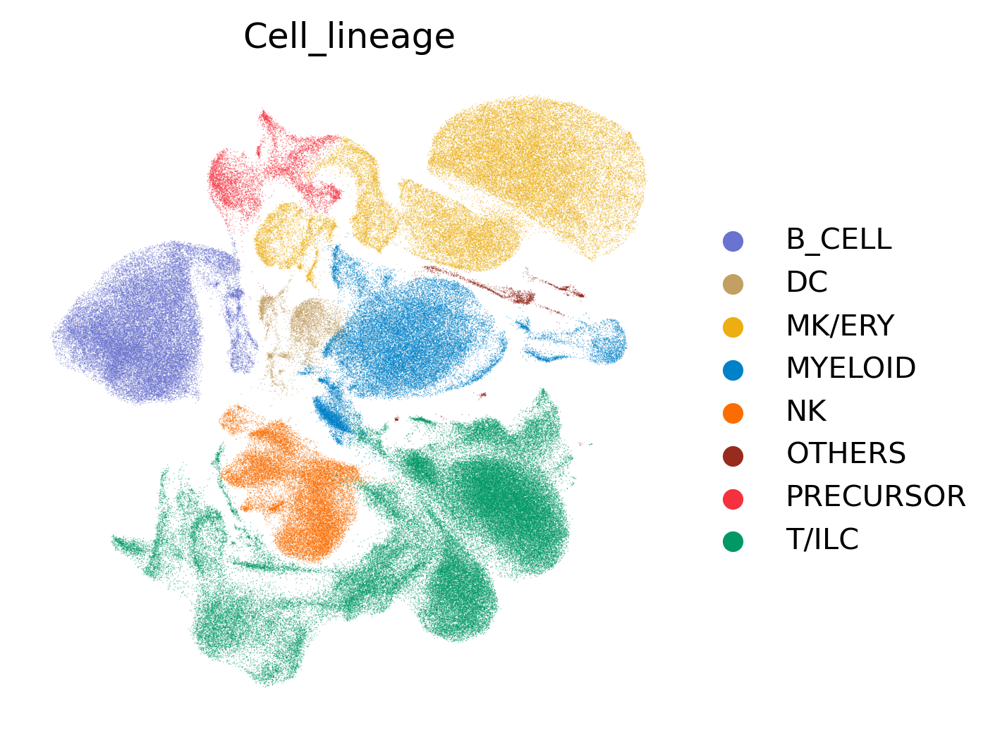

In [25]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300
sc.pl.umap(adata1, color = [ "Cell_lineage"],palette=create_palette(adata1.obs["Cell_lineage"].unique(),[
"#6a73cf","#edae11","#009966","#F6313E", "#fa6e01", "#c29f62","#0081C9","#972b1d"]), alpha=0.5,legend_fontweight="normal",frameon=False)


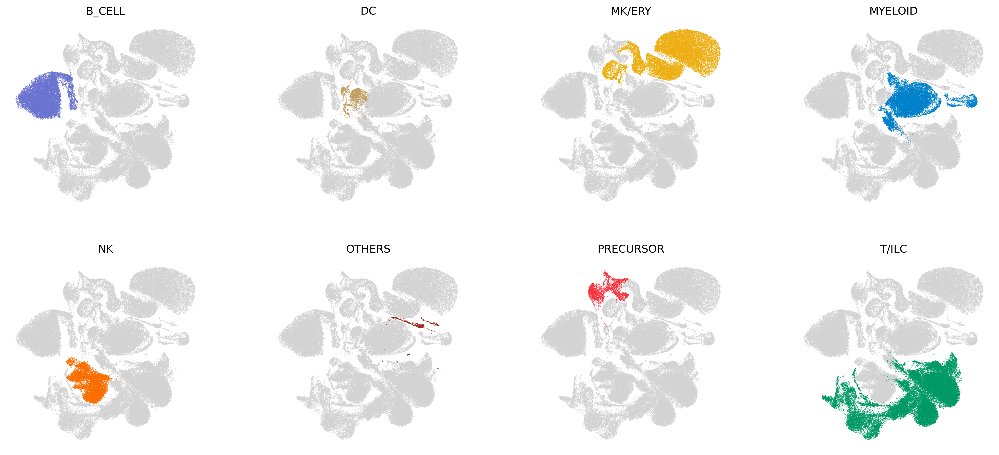

In [26]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300
cluster_small_multiples(adata1,'Cell_lineage',size=1)

In [27]:
import pandas as pd

umap_coords = adata1.obsm['X_umap']
cell_types = adata1.obs['Last_cell_type']

umap_df = pd.DataFrame(umap_coords, columns=['UMAP1', 'UMAP2'], index=adata1.obs_names)

umap_df['cluster'] = adata1.obs['leiden']

umap_df['Cell_Type'] = cell_types

umap_df['Cell_lineage'] = adata1.obs['Cell_lineage']
umap_df['organ']=adata1.obs['New_Body']
umap_df['new_Body']=adata1.obs['New_Body']
umap_df['TCRBCR']=adata1.obs['TCRBCRlabel']

cell_type_codes = adata1.obs['Last_cell_type_num2']


umap_df['Cell_Type_Code'] = cell_type_codes
Umap_obs=adata1.obs
merged_df = pd.concat([umap_df, Umap_obs], axis=1)

print(umap_df.head())
print(merged_df.head())
print(pd.Categorical(cell_types).codes)
print(umap_df["Cell_lineage"].unique())




                            UMAP1      UMAP2 cluster       Cell_Type  \
Cellname                                                               
Z48_AAACCTGAGATAGGAG-1  -4.503597   8.346928      12  CXCR5- Naïve B   
Z48_AAACCTGAGGCACATG-1  15.739136  13.012819       7        Late_ERY   
Z48_AAACCTGAGGTGCAAC-1   9.844523  11.883123      10         Mid_ERY   
Z48_AAACCTGCAAGAGTCG-1  11.173142  16.108231       1        Late_ERY   
Z48_AAACCTGCACACCGAC-1  15.820956  16.131008       7        Late_ERY   

                       Cell_lineage organ new_Body TCRBCR Cell_Type_Code  
Cellname                                                                  
Z48_AAACCTGAGATAGGAG-1       B_CELL  PBMC     PBMC    BCR              7  
Z48_AAACCTGAGGCACATG-1       MK/ERY  PBMC     PBMC   None             37  
Z48_AAACCTGAGGTGCAAC-1       MK/ERY  PBMC     PBMC   None             36  
Z48_AAACCTGCAAGAGTCG-1       MK/ERY  PBMC     PBMC   None             37  
Z48_AAACCTGCACACCGAC-1       MK/ERY  PBMC    

In [28]:
adata1

AnnData object with n_obs × n_vars = 245834 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2', 'Last_cellm'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap', 'Last_cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [29]:
mkdir -p  ./All_scanpyData/UmapData

In [30]:
merged_df.to_csv('./All_scanpyData/UmapData/adata1_umap_obsdata.csv')